In [4]:
# pip install, sometimes pims and trackpy behaves weridly with conda
!pip install pims
!pip install https://github.com/soft-matter/trackpy/archive/master.zip
!pip install imageio-ffmpeg

  Using cached https://github.com/soft-matter/trackpy/archive/master.zip
  Preparing metadata (setup.py) ... done


In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience

import pims
import trackpy as tp

import skimage
from scipy import ndimage
from scipy.optimize import curve_fit

from skimage import morphology, util, filters

import warnings

import matplotlib as mpl
import matplotlib.patches as mpatches
from matplotlib.pyplot import quiver
import matplotlib.pyplot as plt

import bokeh.models
import bokeh.plotting
from bokeh.plotting import figure, show
import bokeh.io
bokeh.io.output_notebook()

from IPython.display import display, clear_output

import panel as pn
pn.extension()

# change the following to %matplotlib notebook for interactive plotting
%matplotlib inline

# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
mpl.rc('image', cmap='gray')

Loading BokehJS ...

### Load image stack

In [2]:
# load tiff stake with pims. Notice here I only have two channels, gfp and cy5
frames = pims.open('/Users/scliu/Documents/AM_imaging/videos/Theo/gray_scale.tif')

In [3]:
len(frames)

36

In [ ]:
f = tp.locate(frames[0], 501, invert=True)


In [ ]:
f.head()  # shows the first few rows of data


In [ ]:
tp.annotate(f, frames[0]);


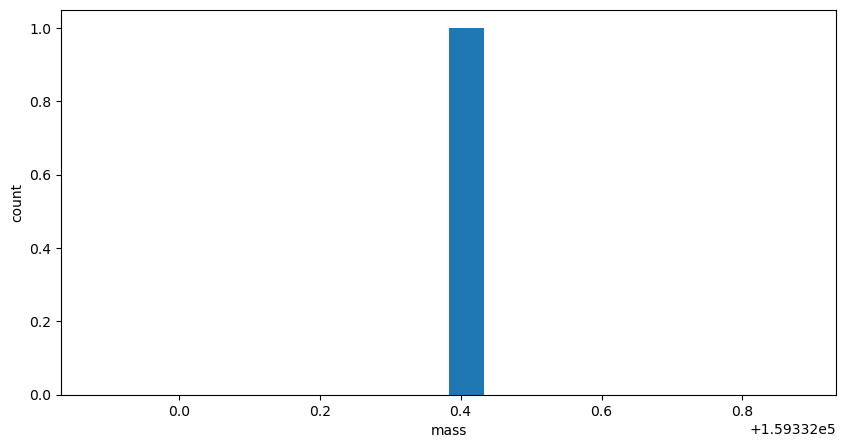

In [39]:
fig, ax = plt.subplots()
ax.hist(f['mass'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='mass', ylabel='count');

In [45]:
f = tp.locate(frames[0], 151, invert=True, minmass=20)


##### f = tp.locate(frames[0], 11, invert=True)


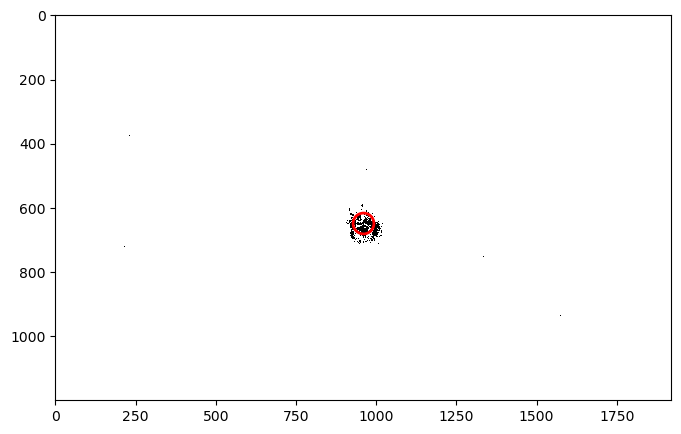

In [46]:
tp.annotate(f, frames[0]);


array([[<AxesSubplot: title={'center': 'x'}>,
        <AxesSubplot: title={'center': 'y'}>]], dtype=object)

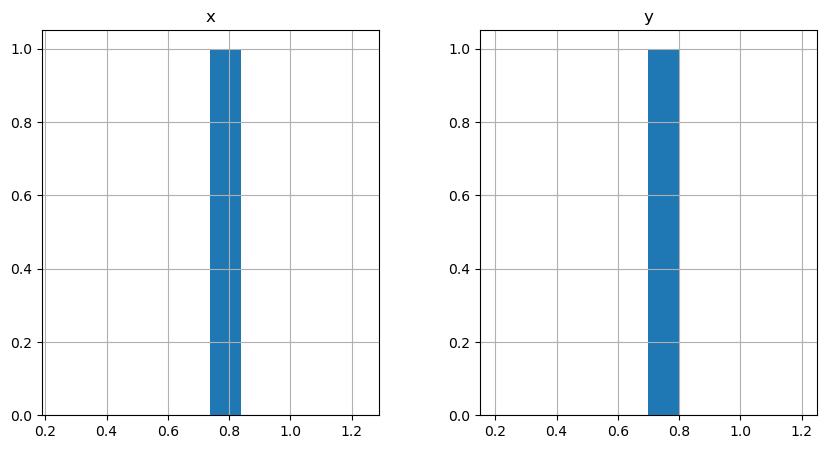

In [44]:
tp.subpx_bias(f)


In [54]:
f = tp.batch(frames[:36], 151, invert=True);


Frame 35: 1 features


In [55]:
t = tp.link(f, 5, memory=3)
t.head()


Frame 35: 1 trajectories present.


,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
0,648.136866,959.797314,552647.680387,54.739241,0.575202,220.875096,811410.0,0.0,0,0
1,490.088224,968.194444,4340.702854,28.250878,0.664736,153.690770,4590.0,0.0,1,1
2,647.326783,958.531391,593698.104454,54.342157,0.546895,216.525671,876945.0,0.0,1,0
3,649.905133,954.385780,536677.239016,52.873740,0.678405,216.827951,778770.0,0.0,2,0
4,652.574432,909.268715,474486.761986,54.353033,0.677952,224.682735,691050.0,0.0,3,2


In [59]:
t1 = tp.filter_stubs(t, 2)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t1['particle'].nunique())

Before: 54
After: 1


In [61]:
t2 = t1[((t1['mass'] > 50) & (t1['size'] < 2.6) &
         (t1['ecc'] < 0.3))]

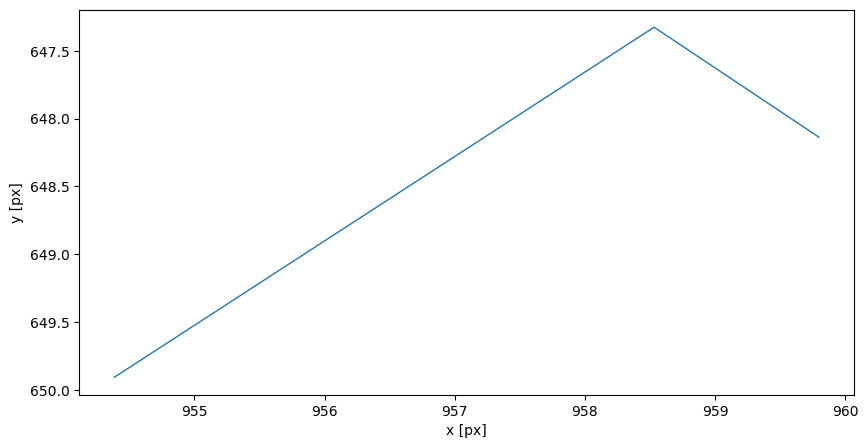

In [63]:
plt.figure()
tp.plot_traj(t1);

### Some image analysis magic

In [4]:
# pre-processing pipeline. Tested out abunch of thresholding techniques and otsu gives the best result: one big
# circle and minimal other stuff
@pims.pipeline
def preprocess_big_droplet(img):
    """
    Apply image processing functions to return a binary image
    """
    # Crop the pictures as for raw images.
    # Apply thresholds
    adaptive_thresh = filters.threshold_yen(img)
    idx = img > adaptive_thresh
    idx2 = img < adaptive_thresh
    img[idx] = 0
    img[idx2] = 225
    img = ndimage.binary_dilation(img)
    img = ndimage.binary_dilation(img)
    return util.img_as_int(img)


Column
    [0] Column
        [0] IntSlider(end=35, name='i')
    [1] Row
        [0] Matplotlib(Figure, height=288, name='interactive00101', width=576)
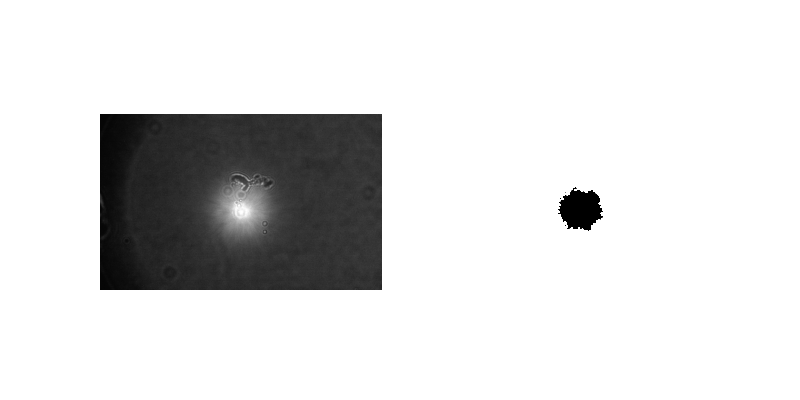

In [5]:
#Let's see what it looks like
sub_frames = preprocess_big_droplet(frames)
# Display results
def display_images(i = 0):
    f = plt.figure(figsize= (8,4))
    plt.subplot(1,2,1)
    plt.imshow(frames[i])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(sub_frames[i], vmin = .0, vmax = .4)
    plt.axis('off')
    plt.close()
    return f
pn.interact(display_images, i = (0, frames.shape[0]-1))

Found 305 features


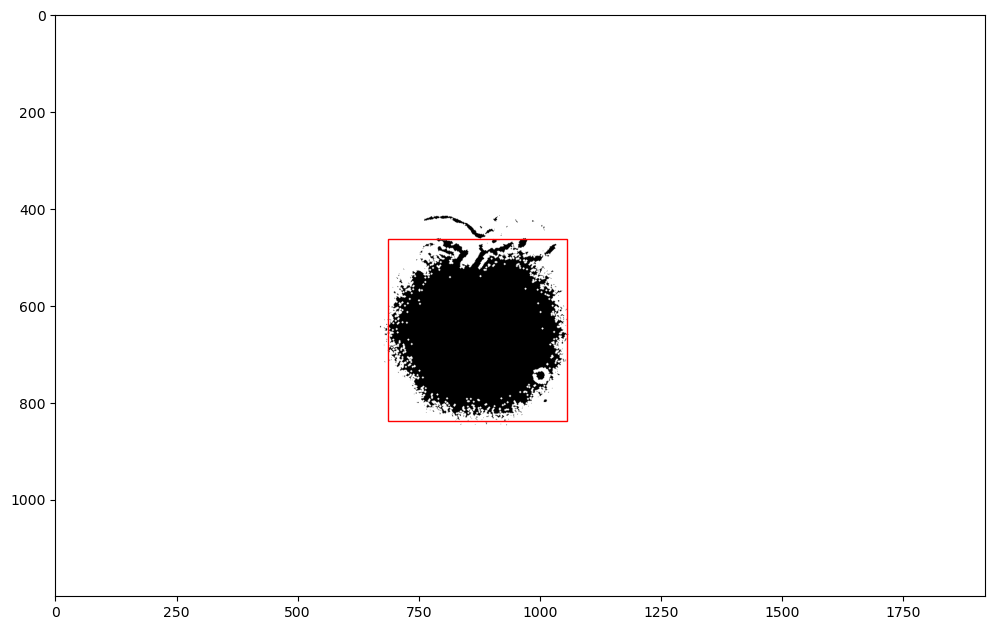

In [9]:
# some tresholding on size and mean intensity. Needed to use a huge region to not include the scale bar
id_example = 4

img_example = sub_frames[id_example]

# Label elements on the picture
white = 255
label_image, number_of_labels = skimage.measure.label(img_example, background=white, return_num=True)
print("Found %d features"%(number_of_labels))
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(12, 12))
ax.imshow(img_example)
for region in skimage.measure.regionprops(label_image, intensity_image=img_example):
    # Everywhere, skip small and large areas
    if region.area < 4000:
        continue
    # Only black areas
    if region.mean_intensity > 1:
        continue
    # On the top, skip small area with a second threshold
    minr, minc, maxr, maxc = region.bbox
    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                              fill=False, edgecolor='red', linewidth=1)

    ax.add_patch(rect)

In [10]:
# Store the big droplet as a feature
warnings.filterwarnings('ignore')

features = pd.DataFrame()
for num, img in enumerate(sub_frames):
    white = 255
    label_image = skimage.measure.label(img, background=white)
    for region in skimage.measure.regionprops(label_image, intensity_image=img):
        # Everywhere, skip small and large areas
        if region.area < 5000:
            continue
    # Only black areas
        if region.mean_intensity > 1:
            continue
        # Store features which survived to the criterions
        features = features.append([{'y': region.centroid[0],
                                     'x': region.centroid[1],
                                     'frame': num,
                                     },])

In [68]:
features

,y,x,frame
0,663.332255,1039.600252,10
0,655.994502,1061.981753,11
0,633.346660,1062.592418,12
0,609.084751,1062.882784,13
0,571.996429,1064.761709,14
0,612.644310,1064.917069,15
0,660.343924,1061.990391,16
0,683.864815,1064.490082,17
0,696.971560,1079.972053,18
0,691.724802,1105.251786,20


### Now we track!

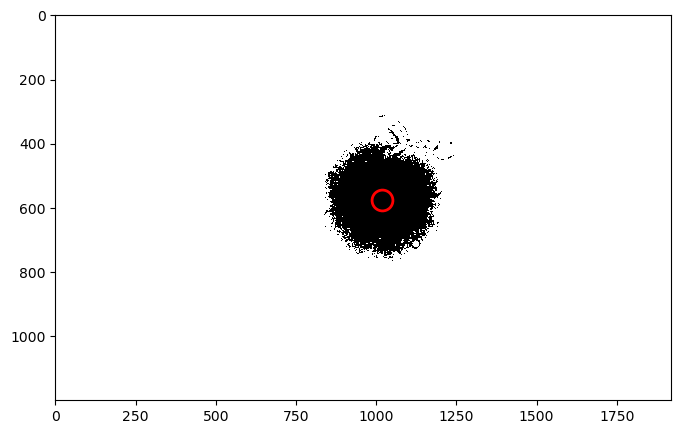

In [11]:
# annotate the center of our droplet
idx = 25
tp.annotate(features[features.frame==(idx)], sub_frames[idx]);


Frame 35: 1 trajectories present.


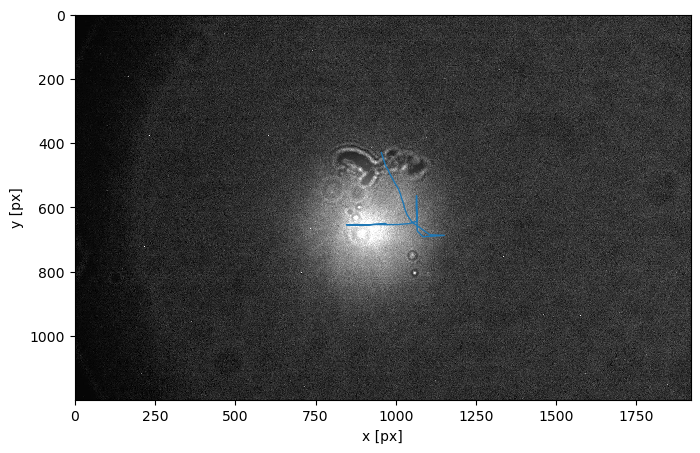

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [14]:
#plot traj on a frame
search_range = 1000
t = tp.link_df(features, search_range, memory=5)
tp.plot_traj(t, colorby='particle',superimpose=frames[3])

In [74]:
t

,y,x,frame,particle
0,663.332255,1039.600252,10,0
0,655.994502,1061.981753,11,0
0,633.346660,1062.592418,12,0
0,609.084751,1062.882784,13,0
0,571.996429,1064.761709,14,1
0,612.644310,1064.917069,15,0
0,660.343924,1061.990391,16,2
0,683.864815,1064.490082,17,2
0,696.971560,1079.972053,18,2
0,691.724802,1105.251786,20,3


### Calculate velocity

In [15]:
col_names = ['dx', 'dy', 'x', 'y', 'frame', 'particle']
# Creating an empty dataframe to store results
pos_data = pd.DataFrame(np.zeros(shape=(1, 6), dtype=np.int64), columns=col_names)
    
for item in set(t.particle):      
        sub = t[t.particle==item]
        
        if sub.shape[0]<=2:
            # Cases in which particle only has 1 or 2 rows of data
            pass
        else:    
            print('Deriving velocities for particle:', str(item))
            dvx = pd.DataFrame(np.gradient(sub.x), columns=['dx',])
            dvy = pd.DataFrame(np.gradient(sub.y), columns=['dy',])
        
            new_df = pd.concat((dvx, dvy, sub.x.reset_index(drop=True), sub.y.reset_index(drop=True),
                                sub.frame.reset_index(drop=True), sub.particle.reset_index(drop=True)),
                                axis=1, names=col_names, sort=False)
            pos_data = pd.concat((pos_data, new_df), axis=0)
    
# This is to get rid of the first 'np.zeros' row and to reset indexes
pos_data = pos_data.reset_index(drop=True)
pos_data = pos_data.drop(0)
pos_data = pos_data.reset_index(drop=True)

Deriving velocities for particle: 0


### plot traj and velocity

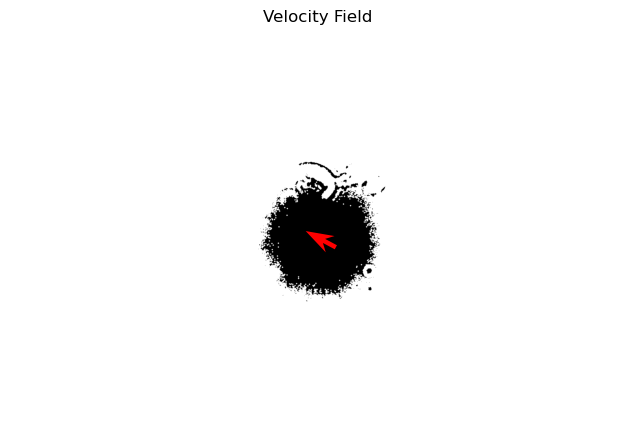

In [18]:
i = 1
d = pos_data[pos_data.frame==i]
plt.imshow(sub_frames[i])
plt.quiver(d.x, d.y, d.dx, -d.dy, pivot='middle', headwidth=4, headlength=6, color='red')
plt.axis('off')
plt.title("Velocity Field")

plt.savefig('/Users/scliu/Documents/AM_imaging/data/Theo/velocity_field', dpi=300, bbox_inches='tight')


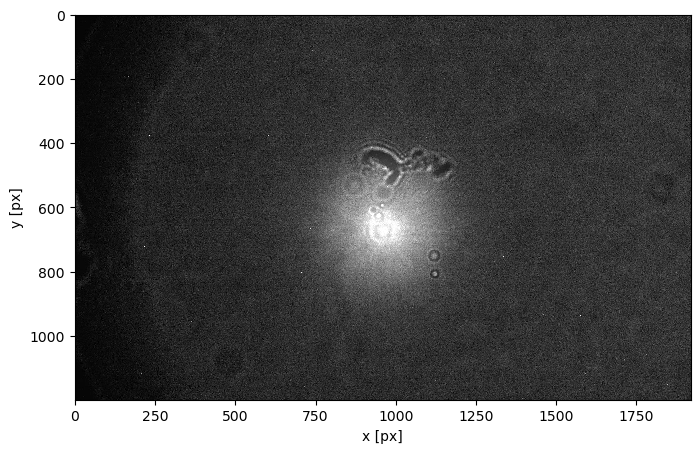

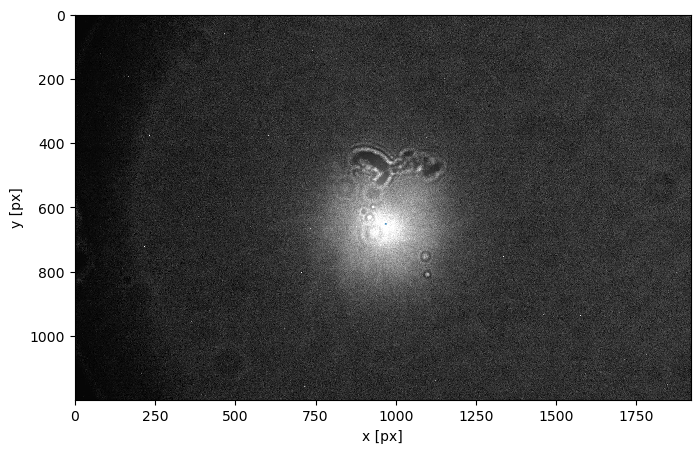

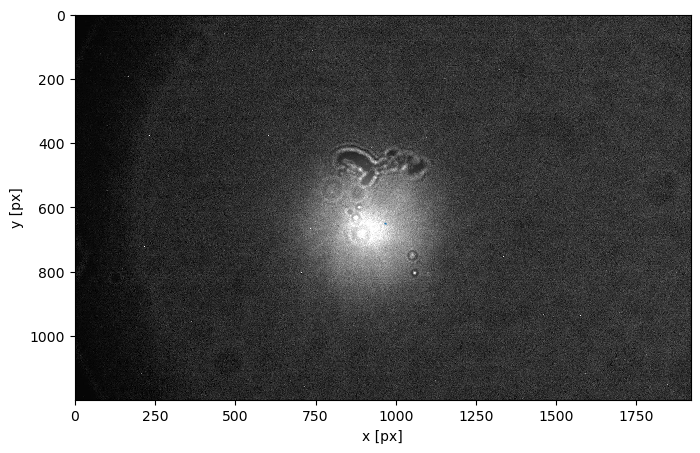

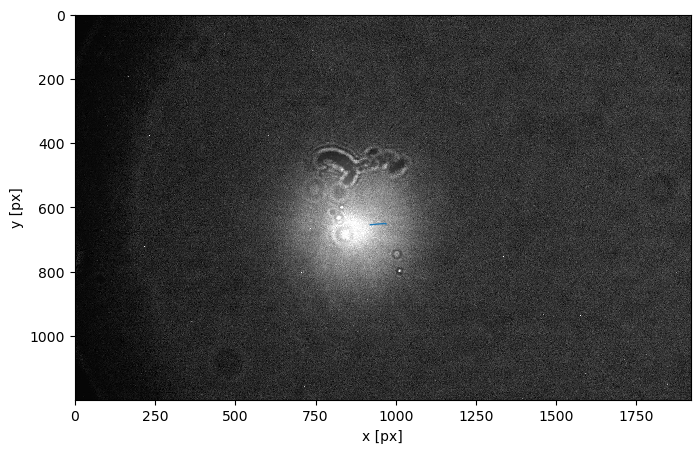

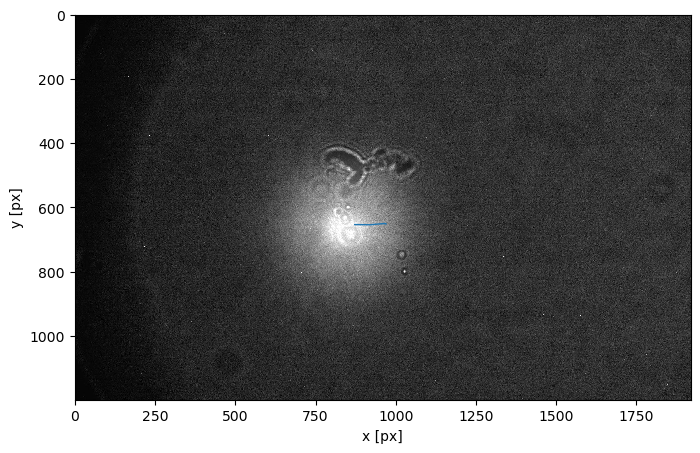

...

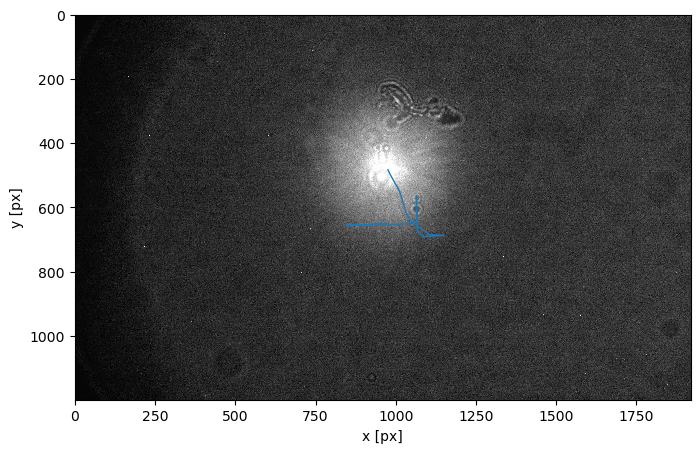

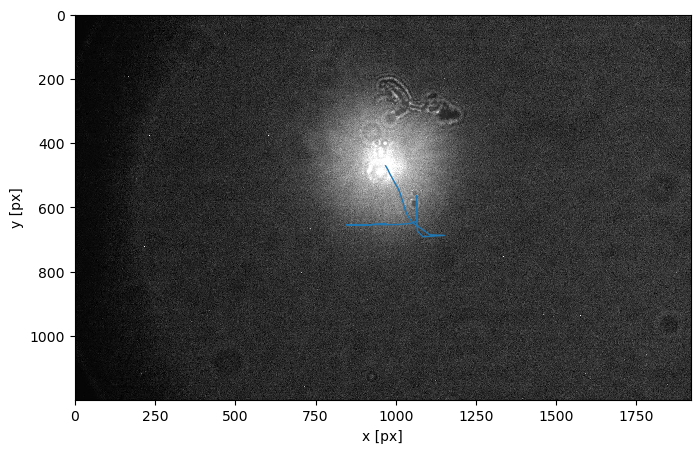

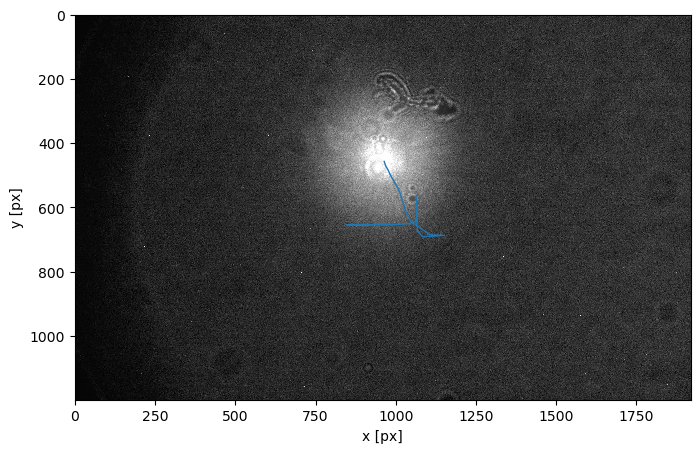

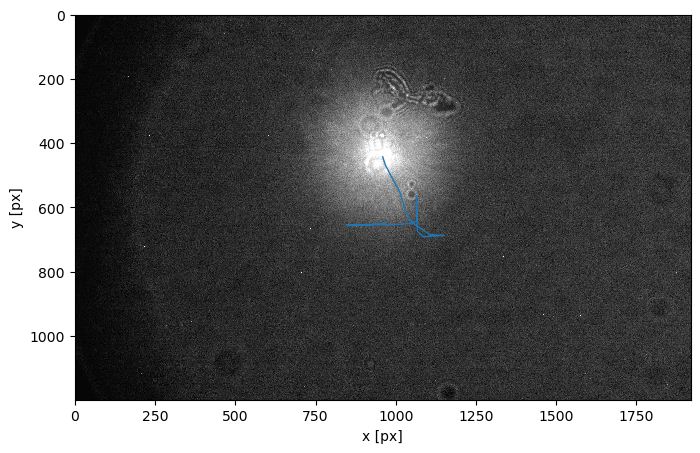

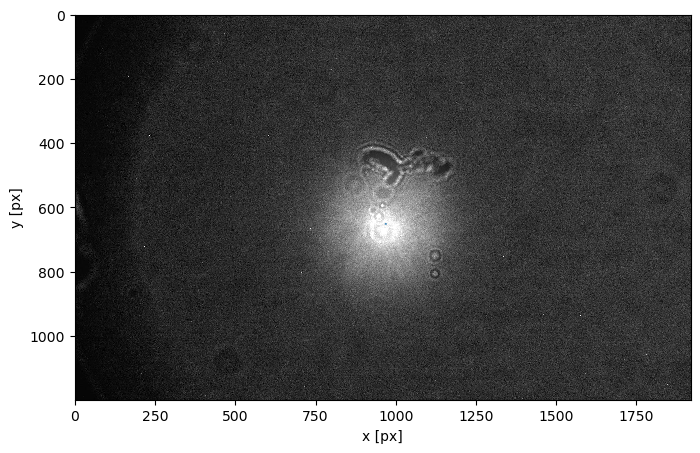

In [21]:
# very sloppy way to plot trajs

for i in range(len(sub_frames)-1):
    fig, ax = plt.subplots()
    tp.plot_traj(t.iloc[:i+1], superimpose=frames[i+1])
    #plt.savefig('videos/oil_emulsion_AM_2/traj{0}.png'.format(i+1))
    fig.savefig('/Users/scliu/Documents/AM_imaging/data/Theo/traj'+ str(i+1), dpi=300, bbox_inches='tight') #path to save the image

#need to save the first frame separately
fig, ax = plt.subplots()
tp.plot_traj(t.iloc[:2], superimpose=frames[0])
fig.savefig('/Users/scliu/Documents/AM_imaging/data/Theo/traj0', dpi=300, bbox_inches='tight')

In [42]:
# need to crop out all the stuff
def plot_image(im, scale=1):
    "Returns a image representation of a 2D array"
    fig, ax = plt.subplots(figsize=(scale*8, scale*8))
    ax.imshow(im, aspect=1)
    ax.grid(False)
    return ax



In [47]:
# I hate myself for doing this

for i in range(len(cy5_frames)-1):
    im = skimage.io.imread('../figures/tracking/doc/traj'+ str(i+1)+'.png')
    zoom = np.s_[55:1600, 293:1838]
    skimage.io.imsave('../figures/tracking/traj/frame_'+ str(i+1)+'.png', im[zoom])
    
im = skimage.io.imread('../figures/tracking/doc/traj0.png')
zoom = np.s_[55:1600, 293:1838]
skimage.io.imsave('../figures/tracking/traj/frame_0.png', im[zoom])

In [16]:
pos_data

,dx,dy,x,y,frame,particle
0,-0.575980,-23.928351,1071.554979,969.015759,1,1
1,-0.478236,-23.004472,1070.978999,945.087409,2,1
2,-0.518881,-21.556652,1070.598507,923.006815,3,1
3,-0.476865,-20.299331,1069.941237,901.974106,4,1
4,-0.379667,-19.513354,1069.644777,882.408154,5,1
5,-0.410652,-18.685956,1069.181903,862.947398,6,1
6,-0.339421,-17.672716,1068.823474,845.036241,7,1
7,-0.382195,-16.988001,1068.503062,827.601966,8,1
8,-0.528864,-17.112077,1068.059084,811.060239,9,1
9,-0.502629,-17.646745,1067.445335,793.377813,10,1


In [14]:
#plot velocity

p = figure(width=800, height=400)

p.circle(pos_data['frame']*10, -pos_data['dy']*0.4300668/10, size=10, color="navy", alpha=0.5)

p.title.text = "Droplet vertical velocity"
p.title.align = "left"
p.title.text_font_size = "25px"
p.xaxis.axis_label = "Time elapsed (sec)"
p.yaxis.axis_label = 'Velocity (μm/s)'

show(p)

### Mean Square Displacement

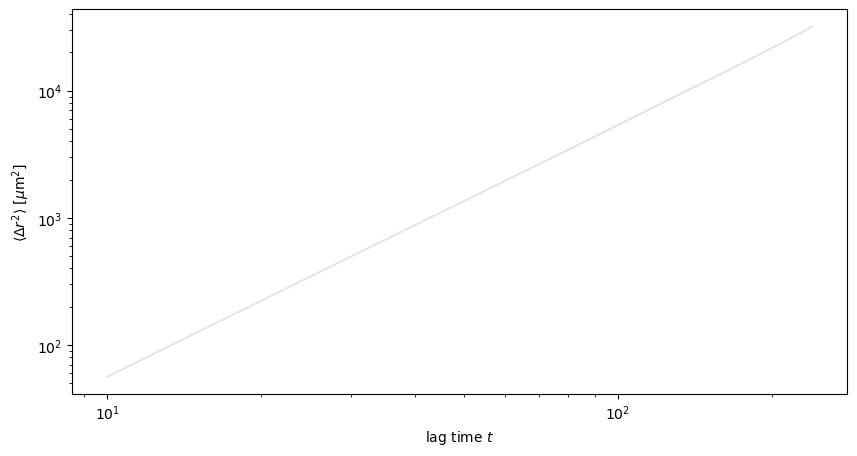

In [12]:
# Calculate and plot MSD vs t

im = tp.imsd(t, 0.4300668, 0.1)  # microns per pixel = 0.4300668., frames per second = 0.1
fig, ax = plt.subplots()

ax.plot(im.index, im[1], 'k-', alpha=0.1)  # black lines, semitransparent
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]',
       xlabel='lag time $t$')
ax.set_xscale('log')
ax.set_yscale('log')


n =  0.42496711958111416 
A =  2.0465983910966674


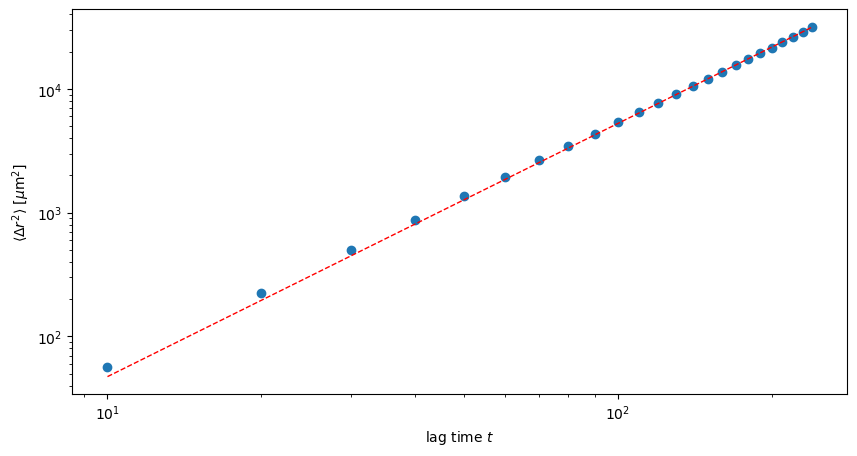

In [13]:
# Function to calculate the power-law with constants a and b
def power_law(x, a, b):
    return a*np.power(x, b)

# Fit the dummy power-law data
pars, cov = curve_fit(f=power_law, xdata=im.index, ydata=im[1], p0=[0, 0], bounds=(-np.inf, np.inf))
# Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
stdevs = np.sqrt(np.diag(cov))
# Calculate the residuals
res = im[1] - power_law(im.index, *pars)

fig, ax = plt.subplots()
ax.plot(im.index, im[1], 'o')
ax.plot(im.index, power_law(im.index, *pars), linestyle='--', linewidth=1, color='red')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]',
       xlabel='lag time $t$');
fig.savefig('../figures/tracking/msd_droplet', dpi=400, bbox_inches='tight')
print('n = ', pars[0], '\nA = ', pars[1])